In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("Kuisioner Aturan Asrama PPKU.csv")
df = df[['Saran dan kritik penutup (opsional)', 'Seberapa efektifkah SR dan GDA dalam menerapkan peraturan asrama?']]
df = df.dropna().reset_index(drop=True)

df.columns = ['Teks', 'Label']

X = df['Teks']
y = df['Label']

print(X.count())
print(y.count())

43
43


In [3]:
print(X.apply(len).mean(), X.apply(len).median())

121.27906976744185 53.0


In [4]:
df.tail()

,Teks,Label
38,Kalau ada tukang dati luar seharusnya di umumk...,2
39,semangat terus!!,3
40,Masih bingung danusan itu termasuk berjualan a...,3
41,Mungkin untuk tahun berikutnya barang elektron...,3
42,Terima kasih atas asrama yang sudah menjadikan...,4


# Praproses

In [5]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

emoji = pd.read_csv("emoji.csv")
emoji['makna'] = emoji['makna'].apply(lambda x: f"<{x}>".replace(" ", "_").lower().strip())

slang = pd.read_csv("slang.csv")

stop_words = stopwords.words("indonesian")
stop_words = [sw for sw in stop_words if ("enggak" not in sw) or ("tidak" not in sw)]

emoji_dict = dict(zip(emoji['emoji'], emoji['makna']))
slang_dict = dict(zip(slang['slang'], slang['formal']))

from string import punctuation
punctuation_replacement = " "*len(punctuation)

In [6]:
emoji[['emoji', 'makna']]

,emoji,makna
0,😴,<wajah_tertidur>
1,🤤,<meneteskan_air_liur>
2,😷,<wajah_ditutupi_masker>
3,🤒,<wajah_dengan_termometer>
4,🤕,<wajah_diperban>
...,...,...
1508,🎞️,<film>
1509,🧾,<tanda_terima>
1510,⏱️,<jam_sukat>
1511,🕹️,<tuas_kendali>


In [7]:
stop_words[:10]

['ada',
 'adalah',
 'adanya',
 'adapun',
 'agak',
 'agaknya',
 'agar',
 'akan',
 'akankah',
 'akhir']

In [8]:
len(stop_words)

758

In [9]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
stemmer = StemmerFactory().create_stemmer()

def stemmer_and_emoji_translate(word):
    return emoji_dict.get(word, stemmer.stem(word))

" ".join(np.vectorize(stemmer_and_emoji_translate)("semoga 2023 jd tahun yg berbahagia 👍".split()))

'moga 2023 jd tahun yg bahagia <jempol_ke_atas>'

In [10]:
def text_cleaner(document):
    # PART 1: Character-wise Cleaning
    document = document.lower()  # case folding
    document = document.replace("\n", " ")  # replace newline
    
    document = re.sub(r"(\d+),(\d+)|(\d+).(\d+)", r"\1\2", document) # remove separator/delimiter for numbers
    document = document.translate(str.maketrans(punctuation, punctuation_replacement))  # replace punctuations
    
    document = re.sub("\s+", " ", document)  # replace white spaces
    document = re.sub(r'^([a-z])\1+', r'\1', document)  # strip excess characters on opening (aaah -> ah)
    document = re.sub(r'([a-z])\1+$', r'\1', document)  # strip excess characters on closing (siappp -> siap)
    
    
    # PART 2: Word-wise Cleaning
    try:
        # Tokenization
        word_tokens = np.array(document.split())
        
        # Slang Normalization
        #word_tokens = np.vectorize(lambda word: slang_dict.get(word, word))(word_tokens)
        #word_tokens = np.array([slang_dict.get(word, word) for word in word_tokens])
        
        # Emoji Translation
        #word_tokens = np.vectorize(lambda word: emoji_dict.get(word, word))(word_tokens)
        
        # Stemming/Lemmatization
        #word_tokens = np.vectorize(stemmer.stem)(word_tokens)  # stemming (sastrawi)
        #word_tokens = np.array(get_lemma(" ".join(word_tokens)).split())  # lemmatization (takes a very long time)
        
        # Emoji Translation + Stemming
        word_tokens = np.vectorize(stemmer_and_emoji_translate)(word_tokens)
        
        # Stopwords Removal
        #word_tokens = word_tokens[~np.isin(word_tokens, stop_words)]
        word_tokens = [word for word in word_tokens if word not in stop_words]
    
    except ValueError:
        print(document)
        word_tokens = np.array([""])
    
    document = " ".join(word_tokens)
    return document

In [11]:
def test_run(corpus):
    myDF = pd.DataFrame(corpus)
    myDF.columns = ['Original']
    
    myDF['Case Folding'] = corpus.apply(lambda x: str(x).lower())
    myDF['Punctuation Removal'] = myDF['Case Folding'].apply(lambda x: str(x).translate(str.maketrans(punctuation, punctuation_replacement)))
    
    myDF['Excess Character Deletion'] = myDF['Punctuation Removal'].apply(lambda document: re.sub("\s+", " ", document))  # replace white spaces
    myDF['Excess Character Deletion'] = myDF['Excess Character Deletion'].apply(lambda document: re.sub(r'^([a-z])\1+', r'\1', document))  # strip excess characters on opening (aaah -> ah)
    myDF['Excess Character Deletion'] = myDF['Excess Character Deletion'].apply(lambda document: re.sub(r'([a-z])\1+$', r'\1', document))  # strip excess characters on closing (siappp -> siap)
    
    myDF['Emoji + Stemming'] = myDF['Excess Character Deletion'].apply(lambda document: np.vectorize(stemmer_and_emoji_translate)(document.split()) if len(document.split()) > 0 else [""]).apply(lambda x: " ".join(x))
    myDF['Hapus Stopwords'] = myDF['Emoji + Stemming'].apply(lambda x: " ".join([i for i in x.split() if i not in stop_words]))

    return myDF

test_run(df['Teks'])

,Original,Case Folding,Punctuation Removal,Excess Character Deletion,Emoji + Stemming,Hapus Stopwords
0,semoga aturan lebih rasional,semoga aturan lebih rasional,semoga aturan lebih rasional,semoga aturan lebih rasional,moga atur lebih rasional,moga atur rasional
1,Semangat,semangat,semangat,semangat,semangat,semangat
2,"Saya rasa tidak ada saran berarti, karena semu...","saya rasa tidak ada saran berarti, karena semu...",saya rasa tidak ada saran berarti karena semu...,saya rasa tidak ada saran berarti karena semua...,saya rasa tidak ada saran arti karena semua ya...,saran arti asrama anggap kenang gambar momen s...
3,"Jamal terbaik sudah dilakukan di c4 dan c5, pe...","jamal terbaik sudah dilakukan di c4 dan c5, pe...",jamal terbaik sudah dilakukan di c4 dan c5 pe...,jamal terbaik sudah dilakukan di c4 dan c5 per...,jamal baik sudah laku di c4 dan c5 tahan tradi...,jamal laku c4 c5 tahan tradisi tsb
4,semoga tugasnya dimudahkan dan dilancarkan yah!!,semoga tugasnya dimudahkan dan dilancarkan yah!!,semoga tugasnya dimudahkan dan dilancarkan yah,semoga tugasnya dimudahkan dan dilancarkan yah,moga tugas mudah dan lancar yah,moga tugas mudah lancar yah
5,Sebaiknya GDA jan galak galak,sebaiknya gda jan galak galak,sebaiknya gda jan galak galak,sebaiknya gda jan galak galak,baik gda jan galak galak,gda jan galak galak
6,"Kurang tegas gda, harusnya ada sip2an jaganya","kurang tegas gda, harusnya ada sip2an jaganya",kurang tegas gda harusnya ada sip2an jaganya,kurang tegas gda harusnya ada sip2an jaganya,kurang tegas gda harus ada sip2an jaga,gda sip2an jaga
7,Bnyk,bnyk,bnyk,bnyk,bnyk,bnyk
8,Sayangnya asramanya ga sampe selesai,sayangnya asramanya ga sampe selesai,sayangnya asramanya ga sampe selesai,sayangnya asramanya ga sampe selesai,sayang asrama ga sampe selesai,sayang asrama ga sampe selesai
9,Tidak ada,tidak ada,tidak ada,tidak ada,tidak ada,


In [12]:
def identify_rare_words(corpus, threshold=1):
    token_counts = pd.Series(corpus).apply(lambda doc: str(doc).split()).explode().value_counts()
    output = token_counts.index[token_counts <= threshold]
    return output

def remove_rare_words(document, rare_words):
    output = [word for word in str(document).split() if word not in rare_words]
    return output
    
def apply_remove_rare_words(corpus):
    rare_words = identify_rare_words(corpus)
    filtered_corpus = pd.Series(corpus).apply(lambda doc: remove_rare_words(doc, rare_words))
    output = np.vectorize(lambda doc: " ".join(doc))(filtered_corpus)
    return output

In [36]:
identify_rare_words(X_train, threshold=1)

Index(['arti', 'adil', 'ipb', 'saran', 'kamar', 'kasih', '10'], dtype='object')

In [13]:
import time

def time_now():
    return time.time()

def track_time(time_start):
    time_elapsed = time_now() - time_start
    hrs = int(time_elapsed//3600)
    mnt = int(time_elapsed%3600//60)
    
    return f"{hrs}:{mnt}"

def apply_text_cleaning(corpus):
    print(len(corpus))
    corpus_clean = []
    start_time = time_now()
    
    
    for count, doc in enumerate(corpus, start=1):
        corpus_clean.append(text_cleaner(doc))  # text_cleaner function in action
        
        if count % 250 == 0:
            if count % 1000 == 0:
                end = "\n"
            else:
                end = "\t"
            print(f"[{count}]={track_time(start_time)}", end=end)
    
    print(f"\n[{count}]={track_time(start_time)}")
    
    corpus_clean = apply_remove_rare_words(corpus_clean)
    corpus_clean = pd.Series(corpus_clean)
    
    return corpus_clean

In [14]:
test_index = 26
print(df.loc[test_index, 'Teks'])
print(text_cleaner(df.loc[test_index, 'Teks']))

Semoga asrama PPKU semakin baik lagi dan insan asrama semakin baik pula
moga asrama ppku insan asrama


In [15]:
df.columns

Index(['Teks', 'Label'], dtype='object')

In [16]:
%%time
X = apply_text_cleaning(X)

43
 

[43]=0:0
Wall time: 60 ms


In [17]:
X.tail(10)

33    jam malam jam 10 mahasiswa tidur kamar asrama ...
34                                  jam 9 jam malam nya
35                                                     
36                                          moga sr gda
37                                    meme kasih gambar
38                                                     
39                                             semangat
40                         masuk jual gak jual gak laku
41    barang elektronik bawa asrama batas yg bawa la...
42    kasih asrama mohon maaf tolong giat sodung jam...
dtype: object

In [18]:
#y = df['Label']
y = y.apply(lambda rating: 1 if rating > 2 else 0)

In [19]:
random_state = 55

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [21]:
print(y_train.value_counts())
print(y_test.value_counts())

1    22
0    12
Name: Label, dtype: int64
1    6
0    3
Name: Label, dtype: int64


# Clustering
## Eksplorasi pra-Clustering

In [22]:
#!pip install wordcloud

In [23]:
from sklearn.feature_extraction.text import CountVectorizer

In [24]:
%%time
CountVec = CountVectorizer(ngram_range=(2, 2))
CountVecFitted = CountVec.fit_transform(X)

pd.DataFrame(CountVecFitted.toarray(), columns=CountVec.get_feature_names_out()).sum().to_dict()

Wall time: 5 ms


{'10 giat': 1,
 '10 mahasiswa': 1,
 'adil mahasiswa': 1,
 'adil terap': 1,
 'ajar ajar': 1,
 'ajar asrama': 1,
 'ajar orang': 1,
 'arti asrama': 1,
 'arti batas': 1,
 'asrama adil': 1,
 'asrama atur': 1,
 'asrama batas': 1,
 'asrama ga': 1,
 'asrama gambar': 1,
 'asrama jamal': 2,
 'asrama mahasiswa': 1,
 'asrama masuk': 1,
 'asrama mohon': 1,
 'asrama orang': 1,
 'asrama ppku': 2,
 'asrama terap': 1,
 'asrama tidur': 1,
 'asrama yg': 1,
 'atur asrama': 1,
 'atur bawa': 1,
 'atur gda': 1,
 'atur kendara': 1,
 'barang elektronik': 4,
 'batas yg': 1,
 'bawa asrama': 1,
 'bawa barang': 2,
 'bawa kendara': 2,
 'bawa laku': 1,
 'bawa setrika': 1,
 'celana pas': 2,
 'celana pendek': 2,
 'daerah daerah': 1,
 'daerah ipb': 1,
 'elektronik bawa': 1,
 'elektronik jual': 1,
 'elektronik setrika': 1,
 'ga asrama': 1,
 'ga selesai': 1,
 'gak jual': 1,
 'gak laku': 1,
 'galak galak': 1,
 'gambar ipb': 1,
 'gda galak': 1,
 'gda insan': 4,
 'gda mohon': 1,
 'gda sr': 1,
 'giat mahasiswa': 2,
 'giat se

In [25]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [26]:
def wordCloudStratified(corpus=pd.Series(dtype='object'), stratifier=pd.Series(dtype='object'), color_code=['Reds', 'Blues'], collocations=False, collocation_threshold=30, ngram_range=(1, 1)):
    groups = stratifier.unique()
    fig, ax = plt.subplots(1, len(groups), figsize=(80, 100))
    i = 0
    
    groups = np.sort(groups)
    if len(groups) > 2:
        color_code = np.where(groups > 3, 'Blues', 'Reds')
    
    for group_name, color_name in zip(groups, color_code):
        #print(group_name, color_name)
        corpus_in_group = corpus.loc[stratifier == group_name]
        
        #texts = ' '.join(word for word in corpus)
        #texts = ' '.join(corpus_in_group.explode())
        
        CountVec = CountVectorizer(ngram_range=ngram_range)
        CountVecFitted = CountVec.fit_transform(corpus_in_group)
        freqs = pd.DataFrame(CountVecFitted.toarray(), columns=CountVec.get_feature_names_out()).sum().to_dict()
        
        #print(texts)
        
        wc = WordCloud(
            colormap=color_name, width=800, height=800, mode='RGBA',
            background_color='white', max_words=300,# min_word_length=1,
            prefer_horizontal=1, random_state=random_state,
            collocations=collocations, collocation_threshold=collocation_threshold
        )
        #wc = wc.generate(texts)
        wc = wc.generate_from_frequencies(freqs)
        
        ax[i].set_title(group_name, fontsize=100)
        ax[i].imshow(wc, interpolation='bilinear')
        ax[i].axis("off")
        ax[i].margins(x=0, y=0)
        i += 1
    
    
    plt.savefig(f'{corpus.name}.png')
    plt.show();

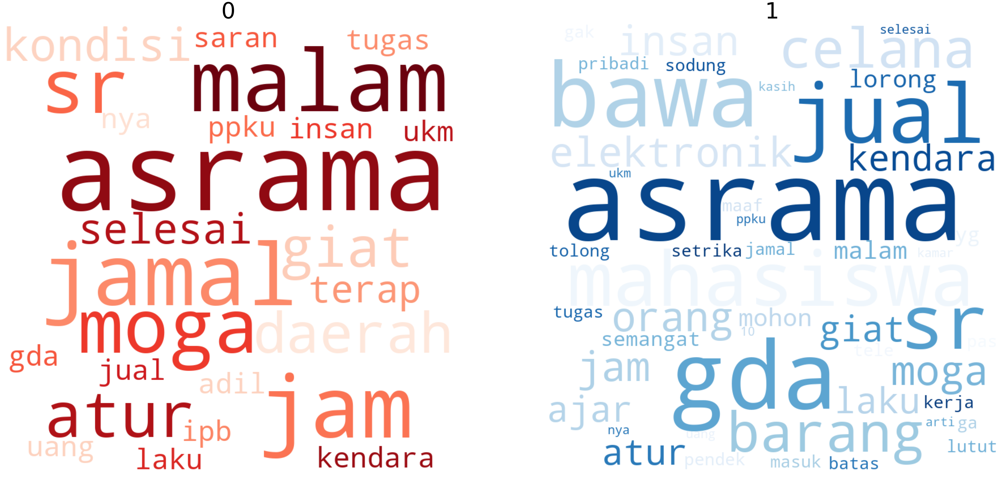

Wall time: 10.2 s


In [27]:
%%time
wordCloudStratified(X_train, y_train)

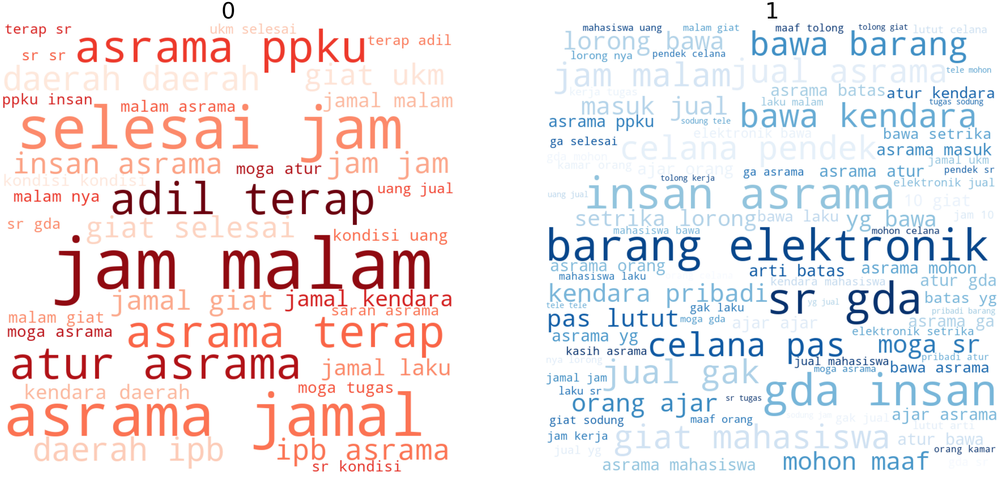

Wall time: 11.4 s


In [28]:
%%time
wordCloudStratified(X_train, y_train, ngram_range=(2, 2))

## Pemodelan Topik & Ukuran Koherensi

In [29]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary

common_texts = X.apply(lambda x: x.split())

# Create a corpus from a list of texts
#common_dictionary = Dictionary(common_texts)
common_dictionary = Dictionary(common_texts)
common_corpus = [common_dictionary.doc2bow(text) for text in common_texts]

# Train the model on the corpus.
#lda = LdaModel(common_corpus, num_topics=10)

lda = LdaModel(
    corpus=common_corpus, id2word=common_dictionary, num_topics=20, random_state=random_state, update_every=1,
    chunksize=len(common_corpus), passes=1, alpha='auto', per_word_topics=True
)

In [30]:
common_corpus[:10]

[[(0, 1), (1, 1)],
 [(2, 1)],
 [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1)],
 [(8, 1), (9, 1)],
 [(1, 1), (10, 1)],
 [(11, 2), (12, 1)],
 [(12, 1)],
 [],
 [(4, 1), (13, 1), (14, 1)],
 []]

In [31]:
lda.print_topics()[:5]

[(0,
  '0.146*"jam" + 0.098*"jamal" + 0.098*"9" + 0.098*"asrama" + 0.098*"daerah" + 0.098*"malam" + 0.050*"nya" + 0.050*"ipb" + 0.050*"selesai" + 0.050*"kendara"'),
 (1,
  '0.255*"asrama" + 0.172*"gda" + 0.172*"insan" + 0.088*"atur" + 0.088*"saran" + 0.004*"yg" + 0.004*"adil" + 0.004*"daerah" + 0.004*"kondisi" + 0.004*"kamar"'),
 (2,
  '0.151*"meme" + 0.151*"kasih" + 0.151*"gambar" + 0.151*"ga" + 0.007*"semangat" + 0.007*"moga" + 0.007*"asrama" + 0.007*"jam" + 0.007*"malam" + 0.007*"gda"'),
 (3,
  '0.153*"asrama" + 0.153*"jam" + 0.103*"kamar" + 0.103*"tidur" + 0.103*"malam" + 0.103*"mahasiswa" + 0.053*"10" + 0.053*"adil" + 0.053*"gda" + 0.003*"semangat"'),
 (4,
  '0.147*"sr" + 0.147*"asrama" + 0.147*"terap" + 0.075*"gda" + 0.075*"atur" + 0.075*"ppku" + 0.075*"adil" + 0.075*"moga" + 0.004*"malam" + 0.004*"ga"')]

In [33]:
coherencemodel = CoherenceModel(model=lda, texts=common_texts, dictionary=common_dictionary, coherence='c_v')

print(coherencemodel.get_coherence())
print(coherencemodel.get_coherence_per_topic())

0.5675024365968139
[0.5470781191089695, 0.5134925823717568, 0.6053892422213518, 0.5145804087302427, 0.5813496545447061, 0.6138541219386966, 0.5770091638725053, 0.7718373601945457, 0.5527523429501784, 0.5526362964039577, 0.5649596651720319, 0.4979747444994043, 0.48910204990053846, 0.542173186387527, 0.6138541219386966, 0.513147463669735, 0.5649596651720319, 0.5728627344168967, 0.5265419825946946, 0.6344938258478119]


In [35]:
np.mean(coherencemodel.get_coherence_per_topic())

0.5675024365968139

In [149]:
def compute_coherence_values(dictionary, corpus, texts, start=2, limit=20, step=1):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    
    source (with adjustment):
    https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#14computemodelperplexityandcoherencescore    
    """
    coherence_values = []
    model_list = []
    topics_num = []
    
    
    for num_topics in range(start, limit, step):
        print(f"{num_topics}/{limit} Start ...", end=" ")
        """model = LdaMulticore(corpus=common_corpus, id2word=common_dictionary, num_topics=num_topics, random_state=random_state,
                             chunksize=len(common_corpus), passes=1, workers=2, per_word_topics=False)"""
        model = LdaModel(corpus=common_corpus, id2word=common_dictionary, num_topics=num_topics, random_state=random_state,
                             chunksize=len(common_corpus), passes=1, per_word_topics=False)
        
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        
        topics_num.append(num_topics)
        model_list.append(model)
        coherence_values.append(coherencemodel.get_coherence())
        
        print(f"Done.", end="\t")

    return topics_num, model_list, coherence_values

In [ ]:
%%time
CoherenceModel(model=lda, texts=common_texts, dictionary=common_dictionary, coherence='c_v').get_coherence()

In [151]:
pd.DataFrame(lda.show_topics(-1, formatted=False))[[1]]

,1
0,"[(jam, 0.14558454), (jamal, 0.09785215), (9, 0..."
1,"[(asrama, 0.25522906), (gda, 0.17154764), (ins..."
2,"[(meme, 0.15107901), (kasih, 0.15107876), (gam..."
3,"[(asrama, 0.15288201), (jam, 0.15288146), (kam..."
4,"[(sr, 0.14695345), (asrama, 0.14695293), (tera..."
5,"[(moga, 0.016949154), (jamal, 0.016949154), (m..."
6,"[(malam, 0.15107843), (semangat, 0.15107839), ..."
7,"[(orang, 0.08273768), (celana, 0.08273755), (m..."
8,"[(jamal, 0.20602968), (jam, 0.105527446), (gia..."
9,"[(semangat, 0.016949154), (jam, 0.016949154), ..."


In [152]:
def show_topics(model, prob=False):
    if prob:
        return pd.DataFrame(model.show_topics(-1, formatted=False))[1].apply(dict).apply(pd.Series).fillna(0)
    else:
        return pd.DataFrame(model.show_topics(-1, formatted=False))[1].apply(lambda x: [i[0] for i in x])

In [153]:
show_topics(lda)

0     [jam, jamal, 9, asrama, daerah, malam, nya, ip...
1     [asrama, gda, insan, atur, saran, yg, adil, da...
2     [meme, kasih, gambar, ga, semangat, moga, asra...
3     [asrama, jam, kamar, tidur, malam, mahasiswa, ...
4     [sr, asrama, terap, gda, atur, ppku, adil, mog...
5     [moga, jamal, meme, ga, gda, jam, semangat, as...
6     [malam, semangat, jam, gda, meme, asrama, sr, ...
7     [orang, celana, mohon, asrama, ajar, arti, pas...
8     [jamal, jam, giat, 10, laku, mahasiswa, semang...
9     [semangat, jam, asrama, moga, malam, ga, gda, ...
10    [moga, jamal, malam, ga, gda, jam, semangat, a...
11    [laku, malam, gak, jual, giat, jam, masuk, mah...
12    [asrama, bawa, barang, yg, elektronik, gda, ga...
13    [malam, giat, asrama, jamal, 9, ukm, jam, sele...
14    [semangat, asrama, gda, jamal, meme, ga, jam, ...
15    [jual, bawa, kendara, mahasiswa, lorong, priba...
16    [semangat, gda, jamal, malam, ga, jam, moga, a...
17    [kondisi, uang, jual, sr, tugas, ukm, moga

In [154]:
show_topics(lda, True)

,jam,jamal,9,asrama,daerah,malam,nya,ipb,selesai,kendara,...,barang,elektronik,tolong,ukm,uang,lorong,pribadi,setrika,tugas,galak
0,0.145585,0.097852,0.097852,0.097852,0.097852,0.097852,0.050119,0.050119,0.050119,0.050119,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.255229,0.004184,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.007194,0.000000,0.000000,0.007194,0.000000,0.007194,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.152881,0.000000,0.000000,0.152882,0.000000,0.102757,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.146953,0.000000,0.003584,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.016949,0.016949,0.000000,0.016949,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.151078,0.000000,0.000000,0.007194,0.000000,0.151078,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.062309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.105527,0.206030,0.000000,0.005025,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.016949,0.000000,0.000000,0.016949,0.000000,0.016949,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [155]:
%%time
topic_lists = pd.DataFrame(lda.show_topics(-1, formatted=False))[1].apply(lambda x: [i[0] for i in x])
print(topic_lists)
CoherenceModel(topics=topic_lists, corpus=common_corpus, texts=common_texts, dictionary=common_dictionary, coherence='c_v').get_coherence()

0     [jam, jamal, 9, asrama, daerah, malam, nya, ip...
1     [asrama, gda, insan, atur, saran, yg, adil, da...
2     [meme, kasih, gambar, ga, semangat, moga, asra...
3     [asrama, jam, kamar, tidur, malam, mahasiswa, ...
4     [sr, asrama, terap, gda, atur, ppku, adil, mog...
5     [moga, jamal, meme, ga, gda, jam, semangat, as...
6     [malam, semangat, jam, gda, meme, asrama, sr, ...
7     [orang, celana, mohon, asrama, ajar, arti, pas...
8     [jamal, jam, giat, 10, laku, mahasiswa, semang...
9     [semangat, jam, asrama, moga, malam, ga, gda, ...
10    [moga, jamal, malam, ga, gda, jam, semangat, a...
11    [laku, malam, gak, jual, giat, jam, masuk, mah...
12    [asrama, bawa, barang, yg, elektronik, gda, ga...
13    [malam, giat, asrama, jamal, 9, ukm, jam, sele...
14    [semangat, asrama, gda, jamal, meme, ga, jam, ...
15    [jual, bawa, kendara, mahasiswa, lorong, priba...
16    [semangat, gda, jamal, malam, ga, jam, moga, a...
17    [kondisi, uang, jual, sr, tugas, ukm, moga

0.5545344029297264

In [156]:
%%time
topics_prob_list = []

#for i in range(20):
for i in range(len(common_corpus)):
    topics_prob = lda.get_document_topics(common_corpus[i], minimum_probability=None)
    topics_prob_list.append(dict(topics_prob))

CoherenceModel(topics=topic_lists[pd.DataFrame(topics_prob_list).idxmax(axis=1)].reset_index(drop=True), corpus=common_corpus, texts=common_texts, dictionary=common_dictionary, coherence='c_v').get_coherence()

Wall time: 2.89 s


0.5396002023726996

In [157]:
%%time
#model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)
topics_num, model_list, coherence_values = compute_coherence_values(dictionary=common_dictionary, corpus=common_corpus, texts=common_texts, start=1, limit=20, step=1)

1/20 Start ... Done.	2/20 Start ... Done.	3/20 Start ... Done.	4/20 Start ... Done.	5/20 Start ... Done.	6/20 Start ... Done.	7/20 Start ... Done.	8/20 Start ... Done.	9/20 Start ... Done.	10/20 Start ... Done.	11/20 Start ... Done.	12/20 Start ... Done.	13/20 Start ... Done.	14/20 Start ... Done.	15/20 Start ... Done.	16/20 Start ... Done.	17/20 Start ... Done.	18/20 Start ... Done.	19/20 Start ... Done.	Wall time: 56.6 s


In [158]:
topics_num[np.argmax(coherence_values)]

12

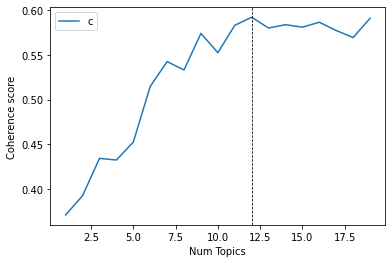

In [159]:
import matplotlib.pyplot as plt

# Show graph
x = topics_num
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.axvline(x=topics_num[np.argmax(coherence_values)], color="black", linestyle="dashed", linewidth=.75)
plt.show();

In [160]:
dict(zip(topics_num, coherence_values))

{1: 0.3707116060132562,
 2: 0.3922962291274712,
 3: 0.4340678793938322,
 4: 0.4322624774441384,
 5: 0.4523438246846078,
 6: 0.5147412049390546,
 7: 0.5425642566729493,
 8: 0.5331980131900519,
 9: 0.5741605531967817,
 10: 0.5525826072793424,
 11: 0.5832113355739401,
 12: 0.5922946204467706,
 13: 0.5802141103369483,
 14: 0.5839622924368074,
 15: 0.5811639716481587,
 16: 0.5867222466821557,
 17: 0.5774427460831214,
 18: 0.5695782248631587,
 19: 0.5910498140204039}

In [161]:
topics_num

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [162]:
print(coherence_values[7])
show_topics(model_list[7])

0.5331980131900519


0    [jamal, asrama, daerah, kendara, bawa, jual, j...
1    [bawa, asrama, barang, elektronik, yg, gda, la...
2    [malam, jam, giat, meme, asrama, jamal, selesa...
3    [asrama, jam, malam, mahasiswa, kamar, sr, tid...
4    [asrama, gda, insan, moga, jual, gak, sr, ppku...
5    [galak, gda, jual, bawa, mahasiswa, kendara, s...
6    [jam, semangat, kondisi, malam, sr, jual, nya,...
7    [asrama, orang, celana, mohon, ajar, gda, tuga...
Name: 1, dtype: object

In [163]:
print(coherence_values[9])
show_topics(model_list[9])

0.5525826072793424


0    [jam, malam, jamal, asrama, 9, giat, selesai, ...
1    [bawa, asrama, barang, elektronik, yg, moga, g...
2    [meme, kasih, gambar, ga, semangat, asrama, gd...
3    [gda, asrama, jam, malam, kamar, mahasiswa, ti...
4    [asrama, gda, insan, moga, jual, gak, sr, laku...
5    [tolong, kerja, jamal, ukm, jual, bawa, kendar...
6    [semangat, kondisi, sr, jual, uang, malam, jam...
7    [asrama, celana, orang, sr, mohon, ajar, terap...
8    [asrama, ga, selesai, semangat, gda, moga, jam...
9    [mahasiswa, bawa, jual, lorong, kendara, malam...
Name: 1, dtype: object

In [164]:
print(coherence_values[12])
show_topics(model_list[12])

0.5802141103369483


0     [jam, nya, 9, asrama, malam, selesai, ga, sema...
1     [sr, atur, terap, asrama, gda, adil, saran, mo...
2     [meme, kasih, gambar, ga, semangat, asrama, gd...
3     [gda, galak, moga, sr, tugas, semangat, asrama...
4     [asrama, insan, moga, ppku, ukm, jamal, semang...
5     [jual, gak, masuk, laku, tolong, kerja, semang...
6     [kondisi, sr, insan, gda, asrama, jual, uang, ...
7     [asrama, orang, celana, gda, mohon, ajar, pas,...
8     [jamal, jam, giat, asrama, malam, selesai, 9, ...
9     [jam, asrama, mahasiswa, malam, tidur, kamar, ...
10    [bawa, asrama, elektronik, barang, yg, mahasis...
11    [mahasiswa, jual, bawa, lorong, kendara, malam...
12    [asrama, jamal, daerah, jam, malam, giat, 9, i...
Name: 1, dtype: object

In [165]:
print(coherence_values[9])
show_topics(model_list[9])

0.5525826072793424


0    [jam, malam, jamal, asrama, 9, giat, selesai, ...
1    [bawa, asrama, barang, elektronik, yg, moga, g...
2    [meme, kasih, gambar, ga, semangat, asrama, gd...
3    [gda, asrama, jam, malam, kamar, mahasiswa, ti...
4    [asrama, gda, insan, moga, jual, gak, sr, laku...
5    [tolong, kerja, jamal, ukm, jual, bawa, kendar...
6    [semangat, kondisi, sr, jual, uang, malam, jam...
7    [asrama, celana, orang, sr, mohon, ajar, terap...
8    [asrama, ga, selesai, semangat, gda, moga, jam...
9    [mahasiswa, bawa, jual, lorong, kendara, malam...
Name: 1, dtype: object

In [166]:
import seaborn as sns

def cross_topics_label(lda, label, percent=False):
    topics_prob_list = []
    
    
    for i in range(len(label)):
        topics_prob = lda.get_document_topics(common_corpus[i], minimum_probability=None)
        topics_prob_list.append(dict(topics_prob))
    
    output = pd.crosstab(label, pd.DataFrame(topics_prob_list).idxmax(axis=1))
    
    #return output.style.background_gradient(cmap='Blues')
    
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    if percent:
        output = output.apply(lambda x: x/x.sum(), axis=0)*100
        ax = sns.heatmap(output, annot=True, fmt = '.2f', cmap="Blues", square=1, linewidth=1.)
        for t in ax.texts:
            t.set_text(t.get_text() + " %")
    else:
        ax = sns.heatmap(output, annot=True, cmap="Blues", square=1, linewidth=1.)

    plt.show();

In [167]:
y_train.value_counts()

1    22
0    12
Name: Label, dtype: int64

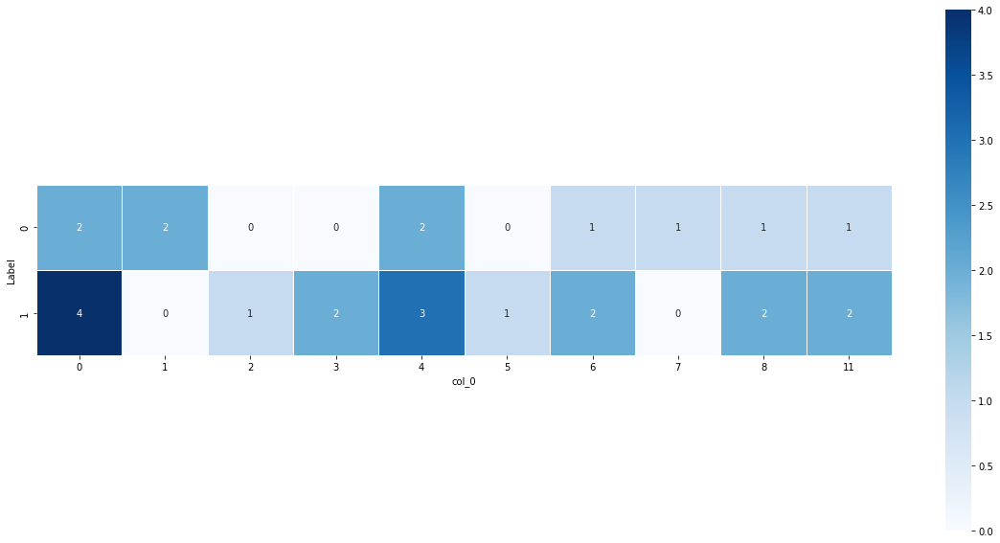

In [231]:
cross_topics_label(lda_best, y_train);

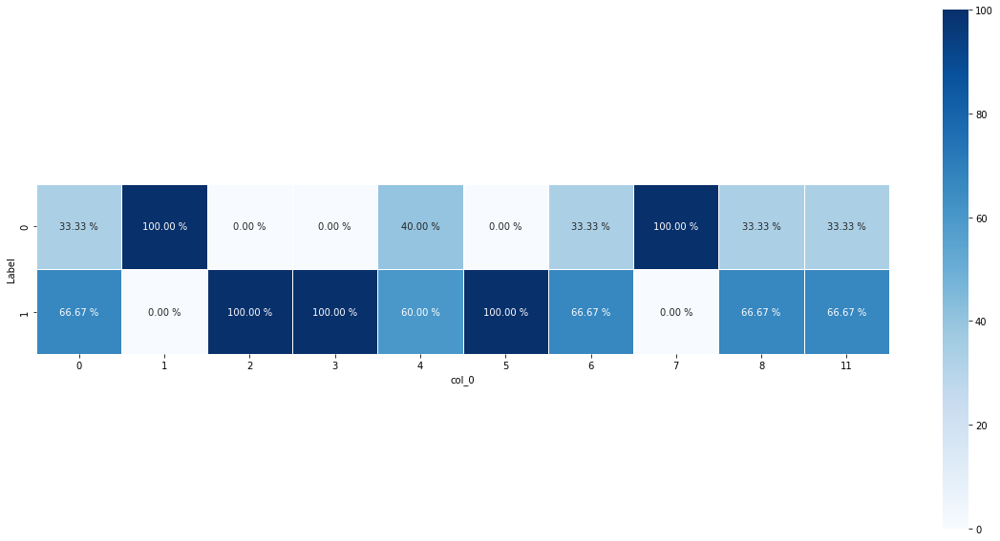

In [232]:
cross_topics_label(lda_best, y_train, True);

In [197]:
"".split()

[]

In [217]:
def infer_topics(model, corpus, concat=False):
    topics_prob_list = []
    corpus_vec = corpus.apply(lambda x: x.split())
    corpus_vec = corpus_vec.apply(lambda x: [""] if len(x) == 0 else x)

    #for i in range(len(corpus)):
    for i in corpus.index:
        doc_bow = common_dictionary.doc2bow(corpus_vec[i])
        topics_prob = model.get_document_topics(doc_bow, minimum_probability=None)
        topics_prob_list.append(dict(topics_prob))
    
    topics_df = pd.DataFrame(topics_prob_list)
    topics_df.index = corpus.index
    topics_df = topics_df.fillna(0)
    
    if concat:
        output = pd.concat([corpus, topics_df], axis=1)
    else:
        output = topics_df
    
    return output

In [218]:
X_train[[0]]

0    moga atur
dtype: object

In [219]:
common_dictionary.doc2bow(X_train[[0]])

[]

In [233]:
lda_best.get_document_topics(common_dictionary.doc2bow(X_train[4].split()), minimum_probability=None)

[(0, 0.027777873),
 (1, 0.027777873),
 (2, 0.027777873),
 (3, 0.02777884),
 (4, 0.027778924),
 (5, 0.027777873),
 (6, 0.027777873),
 (7, 0.6944412),
 (8, 0.027777873),
 (9, 0.027777873),
 (10, 0.027777873),
 (11, 0.027778056)]

In [221]:
from gensim.test.utils import common_texts
common_texts

[['human', 'interface', 'computer'],
 ['survey', 'user', 'computer', 'system', 'response', 'time'],
 ['eps', 'user', 'interface', 'system'],
 ['system', 'human', 'system', 'eps'],
 ['user', 'response', 'time'],
 ['trees'],
 ['graph', 'trees'],
 ['graph', 'minors', 'trees'],
 ['graph', 'minors', 'survey']]

In [222]:
common_dictionary.doc2bow([""])
common_dictionary.doc2bow(["ax"])

[]

In [249]:
show_topics(lda_best).reset_index()

,index,1
0,0,"[jamal, asrama, daerah, jam, ipb, 9, malam, se..."
1,1,"[sr, terap, asrama, gda, atur, adil, saran, se..."
2,2,"[jam, malam, 9, nya, meme, semangat, ga, asram..."
3,3,"[gda, asrama, jam, malam, kamar, tidur, mahasi..."
4,4,"[asrama, insan, gda, moga, sr, ppku, atur, gam..."
5,5,"[tolong, kerja, asrama, semangat, gda, ga, mog..."
6,6,"[kondisi, semangat, sr, jual, uang, asrama, gd..."
7,7,"[orang, celana, asrama, mohon, ajar, moga, pas..."
8,8,"[jamal, jam, giat, malam, asrama, ukm, selesai..."
9,9,"[semangat, asrama, gda, jam, ga, moga, malam, ..."


In [258]:
%%time
#%%capture
topic_assignment = pd.concat({
    "Teks Mentah": df.loc[X_train.index, 'Teks'],
    "Teks Bersih": X_train,
    "Topik": infer_topics(lda_best, X_train).idxmax(axis=1),
}, axis=1)

topic_words = show_topics(lda_best).reset_index()
topic_words.columns = ['Topik', 'Top Words']
topic_assignment = pd.merge(topic_assignment, topic_words, how='left')

topic_assignment.to_csv("topic assignment.csv")
topic_assignment

Wall time: 56 ms


,Teks Mentah,Teks Bersih,Topik,Top Words
0,semangat terus!!,semangat,6,"[kondisi, semangat, sr, jual, uang, asrama, gd..."
1,Masih bingung danusan itu termasuk berjualan a...,masuk jual gak jual gak laku,11,"[jual, mahasiswa, bawa, laku, malam, asrama, l..."
2,Semangat,semangat,6,"[kondisi, semangat, sr, jual, uang, asrama, gd..."
3,Sayangnya asramanya ga sampe selesai,asrama ga selesai,0,"[jamal, asrama, daerah, jam, ipb, 9, malam, se..."
4,Sarannya asrama lebih sering dibersihkan. Krit...,saran asrama,4,"[asrama, insan, gda, moga, sr, ppku, atur, gam..."
5,Nggak ada lah ya,,0,"[jamal, asrama, daerah, jam, ipb, 9, malam, se..."
6,Sebaiknya asrama menetapkan waktu jamal pukul ...,asrama jamal malam giat ukm selesai jam 9 malam,8,"[jamal, jam, giat, malam, asrama, ukm, selesai..."
7,mundurkan jam malam wkkwkwkw,jam malam,2,"[jam, malam, 9, nya, meme, semangat, ga, asram..."
8,"Sr harus tau kondisi IA setiap harinya, kondis...",sr kondisi kondisi uang jual,6,"[kondisi, semangat, sr, jual, uang, asrama, gd..."
9,Jam malam lebih dilonggarkan karena banyak keg...,jam malam giat mahasiswa laku malam,8,"[jamal, jam, giat, malam, asrama, ukm, selesai..."


In [224]:
def get_row_col(index, col_max):
    # row & col starts from 0
    # row_max & col_max starts from 1
    row = index//col_max
    col = index%col_max
    
    return row, col

get_row_col(12, 4)

(3, 0)

In [225]:
from math import ceil

In [226]:
def wordCloudStratified(corpus=pd.Series(dtype='object'), stratifier=pd.Series(dtype='object'), color_code=None, name=None, collocations=False, collocation_threshold=30, ngram_range=(1, 1)):
    groups = stratifier.unique()
    #print(groups)
    col_max = 4
    row_max = ceil(len(groups)/col_max)
    fig, axes = plt.subplots(row_max, col_max, figsize=(80, 100))
    index = 0
    """
    if len(groups) > 2:
        color_code = np.where(groups > 3, 'Blues', 'Reds')
    """
    if color_code is None:
        color_code = ["Greys"]*len(groups)
    else:
        color_code = color_code[groups.argsort()]
        groups = np.sort(groups)
    
    
    for group_name, color_name in zip(groups, color_code):
        #print(group_name, color_name)
        corpus_in_group = corpus.loc[stratifier == group_name]
        
        #texts = ' '.join(word for word in corpus)
        #texts = ' '.join(corpus_in_group.explode())
        
        try:
            CountVec = CountVectorizer(ngram_range=ngram_range, lowercase=False)
            CountVecFitted = CountVec.fit_transform(corpus_in_group)
            freqs = pd.DataFrame(CountVecFitted.toarray(), columns=CountVec.get_feature_names_out()).sum().to_dict()
        except ValueError:
            freqs = {"": 1}
        except TypeError:
            #print(group_name)
            #print(corpus_in_group)
            freqs = {"": 1}
        
        #print(texts)
        
        wc = WordCloud(
            colormap=color_name, width=800, height=800, mode='RGBA',
            background_color='white', max_words=300,# min_word_length=1,
            prefer_horizontal=1, random_state=random_state,
            collocations=collocations, collocation_threshold=collocation_threshold
        )
        #wc = wc.generate(texts)
        wc = wc.generate_from_frequencies(freqs)
        
        if row_max == 1:
            ax = axes[index]
        else:
            row, col = get_row_col(index, col_max)
            #print(row, col, index)
            ax = axes[row, col]
        
        ax.set_title(group_name, fontsize=100)
        ax.imshow(wc, interpolation='bilinear')
        ax.axis("off")
        ax.margins(x=0, y=0)
        index += 1
    
    if name is None:
        name = corpus.name
    
    plt.savefig(f'{name}.png')
    plt.show();

In [227]:
np.sort(infer_topics(model_list[np.argmax(coherence_values)], X_train).idxmax(axis=1).unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 11], dtype=int64)

In [228]:
topics_num[np.argmax(coherence_values)]

12

In [229]:
show_topics(model_list[np.argmax(coherence_values)])

0     [jamal, asrama, daerah, jam, ipb, 9, malam, se...
1     [sr, terap, asrama, gda, atur, adil, saran, se...
2     [jam, malam, 9, nya, meme, semangat, ga, asram...
3     [gda, asrama, jam, malam, kamar, tidur, mahasi...
4     [asrama, insan, gda, moga, sr, ppku, atur, gam...
5     [tolong, kerja, asrama, semangat, gda, ga, mog...
6     [kondisi, semangat, sr, jual, uang, asrama, gd...
7     [orang, celana, asrama, mohon, ajar, moga, pas...
8     [jamal, jam, giat, malam, asrama, ukm, selesai...
9     [semangat, asrama, gda, jam, ga, moga, malam, ...
10    [bawa, asrama, elektronik, barang, yg, gda, la...
11    [jual, mahasiswa, bawa, laku, malam, asrama, l...
Name: 1, dtype: object

In [283]:
infer_topics(model_list[np.argmax(coherence_values)], X_train).loc[19].sum()

1.0000000298023224

In [280]:
topic_prob = infer_topics(model_list[np.argmax(coherence_values)], X_train).round(2)*100
topic_prob = topic_prob.astype(int).astype(str) + "%"
topic_prob.columns = [f"P(Topic = {colname} | D)" for colname in topic_prob.columns]

topic_prob = pd.concat([
    pd.concat({
        "Teks Mentah": df.loc[X_train.index, 'Teks'],
        "Teks Bersih": X_train
    }, axis=1),
    topic_prob
], axis=1)

topic_prob.to_csv("topic_prob.csv")
topic_prob

,Teks Mentah,Teks Bersih,P(Topic = 0 | D),P(Topic = 1 | D),P(Topic = 2 | D),P(Topic = 3 | D),P(Topic = 4 | D),P(Topic = 5 | D),P(Topic = 6 | D),P(Topic = 7 | D),P(Topic = 8 | D),P(Topic = 9 | D),P(Topic = 10 | D),P(Topic = 11 | D)
39,semangat terus!!,semangat,4%,4%,4%,4%,4%,4%,54%,4%,4%,4%,4%,4%
40,Masih bingung danusan itu termasuk berjualan a...,masuk jual gak jual gak laku,1%,1%,1%,1%,1%,1%,1%,1%,1%,1%,1%,87%
1,Semangat,semangat,4%,4%,4%,4%,4%,4%,54%,4%,4%,4%,4%,4%
8,Sayangnya asramanya ga sampe selesai,asrama ga selesai,46%,2%,2%,2%,2%,2%,2%,2%,2%,2%,2%,33%
17,Sarannya asrama lebih sering dibersihkan. Krit...,saran asrama,3%,69%,3%,3%,3%,3%,3%,3%,3%,3%,3%,3%
19,Nggak ada lah ya,,8%,8%,8%,8%,8%,8%,8%,8%,8%,8%,8%,8%
14,Sebaiknya asrama menetapkan waktu jamal pukul ...,asrama jamal malam giat ukm selesai jam 9 malam,0%,0%,0%,0%,0%,0%,0%,0%,91%,0%,0%,0%
29,mundurkan jam malam wkkwkwkw,jam malam,3%,3%,69%,3%,3%,3%,3%,3%,3%,3%,3%,3%
25,"Sr harus tau kondisi IA setiap harinya, kondis...",sr kondisi kondisi uang jual,1%,1%,1%,1%,1%,1%,85%,1%,1%,1%,1%,1%
31,Jam malam lebih dilonggarkan karena banyak keg...,jam malam giat mahasiswa laku malam,1%,1%,1%,1%,1%,1%,1%,1%,54%,1%,1%,34%


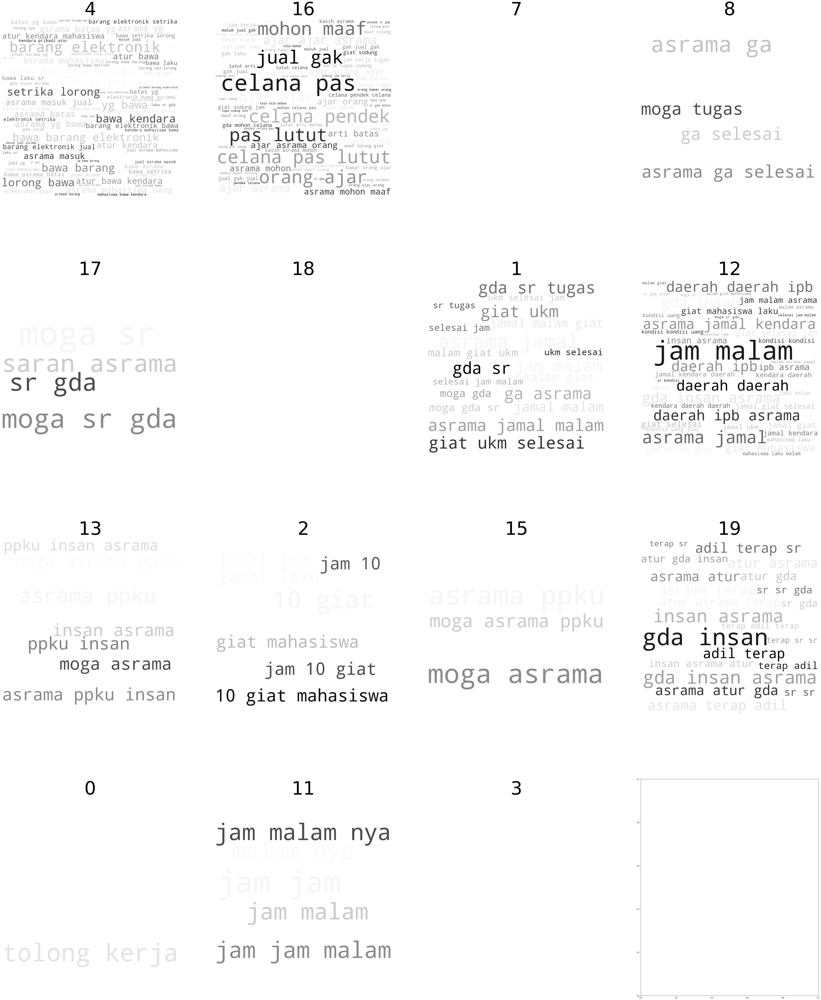

Wall time: 22.1 s


In [76]:
%%time
wordCloudStratified(X_train, infer_topics(model_list[np.argmax(coherence_values)], X_train).idxmax(axis=1), name="10 topic", ngram_range=(2, 3), )wordCloudStratified(X_train, infer_topics(model_list[np.argmax(coherence_values)], X_train).idxmax(axis=1), name="10 topic", ngram_range=(2, 3), color_code=["Greys"]*len(groups))

In [77]:
from itertools import chain

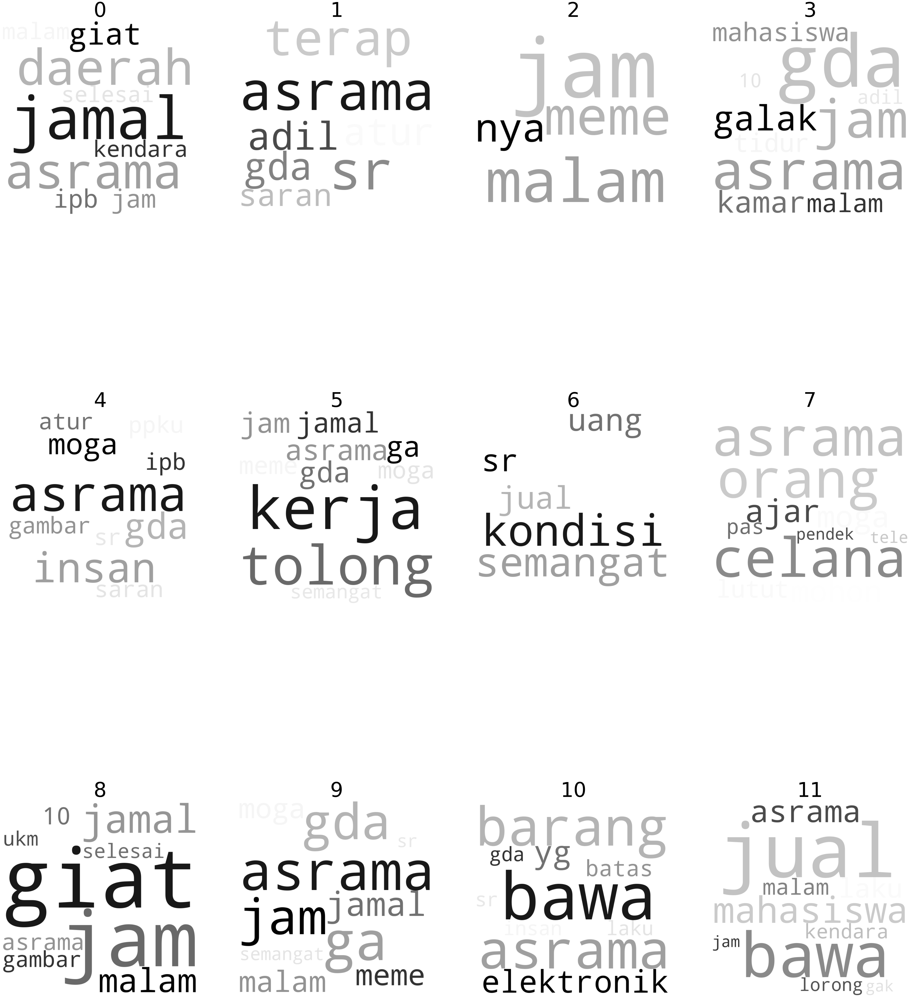

Wall time: 18 s


In [78]:
%%time
summary_topics = (show_topics(model_list[np.argmax(coherence_values)], True)*100).astype(int).apply(lambda col: [[col.name]*value for value in col], axis=0).apply(lambda row: [value for value in row], axis=1).apply(lambda l: " ".join(list(chain.from_iterable(l)))).reset_index()
wordCloudStratified(summary_topics[0], summary_topics['index'])

In [102]:
lda_best = model_list[np.argmax(coherence_values)]

# Word Count & TF-IDF

In [317]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

def word_vectorizer(corpus, tf_idf=False, ngram_range=(1, 1), concat=False):
    if tf_idf:
        vec = TfidfVectorizer(ngram_range=ngram_range)
    else:
        vec = CountVectorizer(ngram_range=ngram_range)
    
    vec_transformed = vec.fit_transform(X_train)
    output = pd.DataFrame(vec_transformed.toarray(), columns=vec.get_feature_names_out(), index=corpus.index)
    
    corpus.name = "Before Vectorization"
    if concat:
        output = pd.concat([corpus, output], axis=1)
    
    return output

In [318]:
word_vectorizer(X_train, concat=True).to_csv("countVec.csv")

In [319]:
word_vectorizer(X_train, tf_idf=True, concat=True).to_csv("tfidfVec.csv")